# Microcosmos - Example 01: Evolving Locomotion

Microcosmos is a GPU-native, fully differentiable physics engine for artificial life. Lifeforms are modeled as elastic filaments that stretch and bend in a viscous 2D fluid environment. This example shows how evolutionary strategies can evolve filament-based organisms that locomote.


### Imports and Setup

In [ ]:
from pathlib import Path
import base64

import jax
import jax.numpy as jnp
import numpy as np
from evosax.algorithms import SNES
from flax import nnx
from IPython.display import HTML, display
from PIL import Image as PILImage
from tqdm import trange

from microcosmos.gym import LineTopology, RingTopology, make
from microcosmos.solver.config import PBD_SCHEME
from microcosmos.utils import displacement


def gif_html(path, width=240):
    data = base64.b64encode(Path(path).read_bytes()).decode("ascii")
    return (
        '<table class="show_videos" style="border-spacing:0px;"><tr>'
        f'<td style="padding:1px;"><img width="{width}" style="image-rendering:auto; object-fit:cover;" '
        f'src="data:image/gif;base64,{data}"></td>'
        '</tr></table>'
    )


def display_gif(frames, path="es_locomotion.gif", fps=10, max_size=240, colors=256, width=240):
    frames = [np.asarray(frame, np.uint8) for frame in frames]
    if not frames:
        raise ValueError("No frames to write.")

    path = Path(path)
    path.parent.mkdir(parents=True, exist_ok=True)
    height, width_px = frames[0].shape[:2]

    pil_frames = []
    resample = getattr(PILImage, "Resampling", PILImage).LANCZOS
    palette = getattr(getattr(PILImage, "Palette", PILImage), "ADAPTIVE")
    for frame in frames:
        if frame.shape[:2] != (height, width_px):
            raise ValueError("All frames must have the same height and width.")
        image = PILImage.fromarray(frame[:, :, :3])
        if max_size and max(image.size) > max_size:
            image.thumbnail((max_size, max_size), resample)
        pil_frames.append(image.convert("P", palette=palette, colors=colors))

    duration_ms = max(1, round(1000 / fps))
    pil_frames[0].save(
        path,
        save_all=True,
        append_images=pil_frames[1:],
        duration=duration_ms,
        loop=0,
        optimize=True,
        disposal=2,
    )

    display(HTML(gif_html(path, width=width)))
    return path


## Shared Training Setup

Microcosmos has a gym-like API. Create named environments with `microcosmos.gym.make(...)`, then interact with them through `reset(key)` and `step(key, state, action)`.

The supported environments expose different morphologies with the same interface. Use named single-creature environments such as `line` and `ring` for simple locomotion tasks. Use the `multi-agent` environment for multi-creature setups by passing creature topology instances such as `LineTopology(...)` and `RingTopology(...)` through the `creatures` argument.

Each observation is a flat vector with per-node information: center-of-mass-relative node positions, node velocities, and one energy/food reading per node. For the no-food locomotion tasks here, the energy readings are zero by default, but they stay in the observation so the same controller shape also works with food-seeking environments.

### Controller

The controller is a tiny neural network policy. It reads the full observation and outputs two values per node: one for changing edge lengths and one for changing bending angles. Those actions are passed to the physics solver, which turns them into motion.


In [31]:
class Controller(nnx.Module):
    def __init__(self, obs_dim: int, num_nodes: int, hidden_dim: int, rngs: nnx.Rngs):
        self.num_nodes = num_nodes
        self.l1 = nnx.Linear(obs_dim, hidden_dim, rngs=rngs)
        self.l2 = nnx.Linear(hidden_dim, num_nodes * 2, rngs=rngs)

    def __call__(self, obs):
        hidden = jnp.tanh(self.l1(obs))
        return jnp.tanh(self.l2(hidden)).reshape(self.num_nodes, 2)


### Training and Rendering Helpers

SNES searches over the controller parameters. Fitness is rightward center-of-mass displacement, and the renderer saves the best rollout as a GIF.

By default, the training helper uses one controller for the whole environment. For `multi-agent`, separate controllers are enabled automatically so each creature always has its own controller.

In [32]:
def _agent_observation(obs, node_slice, num_nodes):
    positions = obs[: 2 * num_nodes].reshape(num_nodes, 2)
    velocities = obs[2 * num_nodes : 4 * num_nodes].reshape(num_nodes, 2)
    energy = obs[4 * num_nodes :]

    local_positions = positions[node_slice]
    local_positions = local_positions - local_positions.mean(axis=0)
    return jnp.concatenate([
        local_positions.reshape(-1),
        velocities[node_slice].reshape(-1),
        energy[node_slice],
    ])


def train_locomotion(env_name, seed=1, population=64, generations=40, hidden_dim=64, rest_length_scale=0.05, bending_angle_scale=0.50, grid_shape=(256, 256), dt=0.035, max_steps=500, solver_config=PBD_SCHEME, separate_controllers=False, env_label=None, **env_kwargs):
    env = make(env_name, grid_shape=grid_shape, dt=dt, max_steps=max_steps, solver_config=solver_config, **env_kwargs)
    label = env_label or env_name

    if env_name == "multi-agent":
        separate_controllers = True

    obs0, state0 = env.reset(jax.random.PRNGKey(0))
    edge_pairs = state0.edges.pairs
    bending_center_nodes = edge_pairs[state0.edges.bending_pairs[:, 0], 1]

    if separate_controllers:
        node_slices = getattr(env, "node_slices", (slice(0, env.num_nodes),))
        graphdefs = []
        params0 = []
        for i, node_slice in enumerate(node_slices):
            num_agent_nodes = node_slice.stop - node_slice.start
            agent_obs0 = _agent_observation(obs0, node_slice, env.num_nodes)
            graphdef, params = nnx.split(
                Controller(agent_obs0.shape[0], num_agent_nodes, hidden_dim, rngs=nnx.Rngs(i))
            )
            graphdefs.append(graphdef)
            params0.append(params)
        graphdefs = tuple(graphdefs)
        params0 = tuple(params0)

        def controller_action(params, obs):
            rest_by_node = jnp.zeros(env.num_nodes)
            bend_by_node = jnp.zeros(env.num_nodes)
            for graphdef, agent_params, node_slice in zip(graphdefs, params, node_slices):
                agent_obs = _agent_observation(obs, node_slice, env.num_nodes)
                agent_rest, agent_bend = nnx.merge(graphdef, agent_params)(agent_obs).T
                rest_by_node = rest_by_node.at[node_slice].set(agent_rest)
                bend_by_node = bend_by_node.at[node_slice].set(agent_bend)
            return {
                "d_rest_length": rest_length_scale * rest_by_node[edge_pairs[:, 0]],
                "d_bending_angle": bending_angle_scale * bend_by_node[bending_center_nodes],
            }
    else:
        graphdef, params0 = nnx.split(Controller(obs0.shape[0], env.num_nodes, hidden_dim, rngs=nnx.Rngs(0)))

        def controller_action(params, obs):
            rest_by_node, bend_by_node = nnx.merge(graphdef, params)(obs).T
            return {"d_rest_length": rest_length_scale * rest_by_node[edge_pairs[:, 0]], "d_bending_angle": bending_angle_scale * bend_by_node[bending_center_nodes],}

    print(f"{label}: {sum(x.size for x in jax.tree.leaves(params0))} parameters")

    def rollout_fitness(params):
        creature_slices = getattr(env, "node_slices", (slice(0, env.num_nodes),))
        start_com = jnp.stack([state0.nodes.position[s].mean(axis=0) for s in creature_slices], axis=0)

        def body(carry, _):
            state, obs = carry
            obs, state, _, _, _ = env.step(jax.random.PRNGKey(0), state, controller_action(params, obs))
            return (state, obs), None

        (state, _), _ = jax.lax.scan(body, (state0, obs0), None, length=env.max_steps)
        end_com = jnp.stack([state.nodes.position[s].mean(axis=0) for s in creature_slices], axis=0)
        return jnp.sum(displacement(env.grid_shape, end_com, start_com)[:, 0])

    fitness = jax.jit(rollout_fitness)
    key = jax.random.PRNGKey(seed)
    strategy = SNES(population_size=population, solution=params0)
    es_params = strategy.default_params
    key, init_key = jax.random.split(key)
    es_state = strategy.init(init_key, params0, es_params)
    best_params, best_score = params0, float(fitness(params0))
    history = {"mean": [], "max": [], "best": []}
    print("initial fitness", best_score)

    for _ in (pbar := trange(generations, desc=f"{label} evolving")):
        key, ask_key, tell_key = jax.random.split(key, 3)
        candidates, es_state = strategy.ask(ask_key, es_state, es_params)
        scores = jax.vmap(fitness)(candidates)
        scores.block_until_ready()
        es_state, _ = strategy.tell(tell_key, candidates, -scores, es_state, es_params)

        gen_best_idx = int(jnp.argmax(scores))
        gen_best_score = float(scores[gen_best_idx])
        if gen_best_score > best_score:
            best_score = gen_best_score
            best_params = jax.tree.map(lambda x: x[gen_best_idx], candidates)

        mean_score = float(scores.mean())
        history["mean"].append(mean_score)
        history["max"].append(gen_best_score)
        history["best"].append(best_score)
        pbar.set_postfix(mean=f"{mean_score:.3f}", max=f"{gen_best_score:.3f}", best=f"{best_score:.3f}")

    return dict(env_name=label, env=env, best_params=best_params, best_score=best_score, history=history, controller_action=controller_action)


def render_locomotion(result, every=8, size=288):
    env, controller_action = result["env"], result["controller_action"]
    obs, state = env.reset(jax.random.PRNGKey(0))
    frames = []
    for t in range(env.max_steps):
        obs, state, _, _, _ = env.step(jax.random.PRNGKey(0), state, controller_action(result["best_params"], obs))
        if t % every == 0:
            frames.append(env.render(state, size=size))
    return frames

## Line Locomotion


line: 13564 parameters
initial fitness -2.7539291381835938


line evolving: 100%|██████████| 40/40 [01:33<00:00,  2.33s/it, best=119.286, max=112.409, mean=64.254]


""

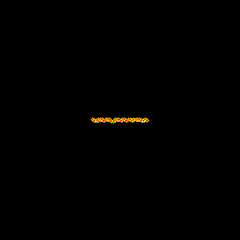

In [33]:
line_result = train_locomotion("line", num_nodes=30)
_ = display_gif(render_locomotion(line_result), path="outputs/es_locomotion_line.gif", fps=10)


## Ring Locomotion


ring: 22564 parameters
initial fitness -3.168548583984375


ring evolving:   0%|          | 0/40 [00:00<?, ?it/s]

ring evolving: 100%|██████████| 40/40 [01:33<00:00,  2.34s/it, best=121.731, max=118.455, mean=75.117]


""

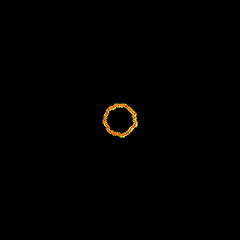

In [34]:
ring_result = train_locomotion("ring", num_nodes=50)
_ = display_gif(render_locomotion(ring_result), path="outputs/es_locomotion_ring.gif", fps=10)


## Multi-Agent Locomotion

The environment `multi-agent` lets you compose multiple creature topologies in one world. Here we use two lines and three rings.

Each creature automatically gets its own controller, using only that creature’s local observations (positions, velocities, energy) to produce its actions.

This section skips multi-agent training and instead composes a team from previously trained single-creature controllers.

""

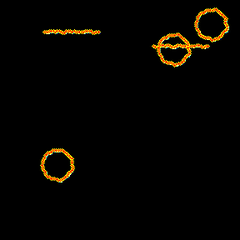

In [35]:
multi_agent_env = make(
    "multi-agent",
    creatures=(
        LineTopology(num_nodes=line_result["env"].num_nodes, spacing=2.0, bending_stiffness=0.5),
        LineTopology(num_nodes=line_result["env"].num_nodes, spacing=2.0, bending_stiffness=0.5),
        RingTopology(num_nodes=ring_result["env"].num_nodes, spacing=2.0, bending_stiffness=0.5),
        RingTopology(num_nodes=ring_result["env"].num_nodes, spacing=2.0, bending_stiffness=0.5),
        RingTopology(num_nodes=ring_result["env"].num_nodes, spacing=2.0, bending_stiffness=0.5),
    ),
    random_initial_positions=True,
    position_margin=4.0,
    grid_shape=line_result["env"].grid_shape,
    dt=line_result["env"].dt,
    max_steps=line_result["env"].max_steps,
    solver_config=line_result["env"].solver_config,
)

multi_agent_controller_fns = (
    line_result["controller_action"],
    line_result["controller_action"],
    ring_result["controller_action"],
    ring_result["controller_action"],
    ring_result["controller_action"],
)
multi_agent_params = (
    line_result["best_params"],
    line_result["best_params"],
    ring_result["best_params"],
    ring_result["best_params"],
    ring_result["best_params"],
)

def multi_agent_pretrained_action(params, obs):
    creature_actions = []
    for controller_fn, creature_params, node_slice in zip(
        multi_agent_controller_fns, params, multi_agent_env.node_slices
    ):
        creature_obs = _agent_observation(obs, node_slice, multi_agent_env.num_nodes)
        creature_actions.append(controller_fn(creature_params, creature_obs))
    return multi_agent_env.merge_action(creature_actions)

multi_agent_result = {
    "env_name": "multi-agent-pretrained",
    "env": multi_agent_env,
    "best_params": multi_agent_params,
    "controller_action": multi_agent_pretrained_action,
}
_ = display_gif(render_locomotion(multi_agent_result), path="outputs/es_locomotion_multi_agent.gif", fps=10)